# ProtsT5 Evo-Tuning

This notebook allows you to continue the unsupervised pre-training for [ProstT5](https://github.com/mheinzinger/ProstT5).

In this example we show how to [evo-tune](https://www.nature.com/articles/s41592-019-0598-1) the model for the [PHROG 10](https://phrogs.lmge.uca.fr/cgi-bin/script_mega_2018.py?mega=10) major head protein group.

For better perfomance we apply [Parameter-Efficient Fine-Tuning (PEFT)](https://huggingface.co/blog/peft). For this we apply [LoRA: Low-Rank Adaptation of Large Language Models](https://arxiv.org/abs/2106.09685).

The core training loop is implemented with the pytorch [huggingface trainer](https://huggingface.co/docs/transformers/main_classes/trainer).


## Imports and env. variables

In [24]:
#import dependencies
import os.path

# mamba install pytorch torchvision torchaudio pytorch-cuda=12.1 -c pytorch -c nvidia
# pip install evaluate matplotlib numpy pandas datasets biopython transformers sentencepiece  accelerate>=0.26.0
import json

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader


import re
import numpy as np
import pandas as pd
import copy

import transformers, datasets

from transformers import T5Tokenizer, AutoModelForSeq2SeqLM, Seq2SeqTrainingArguments, Seq2SeqTrainer
from transformers import DataCollatorForLanguageModeling
from transformers import GenerationConfig
from transformers import TrainingArguments, Trainer, set_seed
from transformers import EarlyStoppingCallback

from typing import Optional, Tuple, Union, Any, List, NewType, Callable, Dict
from collections.abc import Mapping

from transformers.trainer_callback import TrainerCallback

import peft
from peft import get_peft_config, PeftModel, PeftConfig, LoraConfig, get_peft_model

from evaluate import load
from datasets import Dataset

from tqdm import tqdm
import random

from Bio import SeqIO

import matplotlib.pyplot as plt

# Environment to run this notebook


These are the versions of the core packages we use to run this notebook:

In [25]:
print("Torch version: ",torch.__version__)
print("Cuda version: ",torch.version.cuda)
print("Numpy version: ",np.__version__)
print("Pandas version: ",pd.__version__)
print("Transformers version: ",transformers.__version__)
print("Datasets version: ",datasets.__version__)

Torch version:  2.5.1
Cuda version:  12.1
Numpy version:  2.2.2
Pandas version:  2.2.3
Transformers version:  4.48.1
Datasets version:  3.2.0


# Model checkpoint

In [26]:
checkpoint = "Rostlab/ProstT5_fp16"

# Input data

We load 3 sets of files:

1.   An AA and 3Di FASTA holding all deduplicated PHROG 10 AA and Colabfold-predicted 3Di seqeunces
2.   An AA and 3Di FASTA holding 25 of these PHROG 10 proteins an a validation set for overfitting
3.   An AA and 3Di FASTA holding the first 25 AA and 3Di sequences from the Foldseek Swissprot dabatase

i.e.

```
foldseek databases swissprot Alphafold/Swiss-Prot tmp
foldseek convert2fasta swissprot  swissprot_aa.fasta
foldseek lndb swissprot_h swissprot_ss_h
foldseek convert2fasta swissprot_ss  swissprot_ss.fasta

head -n 5000 | tail -n 60 swissprot_aa.fasta > swissprot_subset_aa.fasta
head -n 5000 | tail -n 60 swissprot_ss.fasta > swissprot_subset_ss.fasta

```



In [27]:
from Bio import SeqIO
from io import StringIO
import requests

# File paths
aa_fasta_path = "data/phrog_10_db_aa.fasta"
ss_fasta_path = "data/phrog_10_db_ss.fasta"

# Parse FASTA files
aa_records = {record.id: str(record.seq) for record in SeqIO.parse(aa_fasta_path, "fasta")}
ss_records = {record.id: str(record.seq).lower() for record in SeqIO.parse(ss_fasta_path, "fasta")} # 3Di is lower case in tokenizer

# Ensure both FASTA files have the same headers
if set(aa_records.keys()) != set(ss_records.keys()):
    raise ValueError("Headers in the amino acid and 3Di FASTA files do not match.")

# Create DataFrame
data = {
    "name": list(aa_records.keys()),
    "sequence": [aa_records[name] for name in aa_records.keys()],
    "3di": [ss_records[name] for name in aa_records.keys()],
}

phrog10_df = pd.DataFrame(data)

print(len(phrog10_df))

phrog10_df.head(5)

#3: Random subset of swissprot seqs

aa_fasta_path = "data/phrog_10_db_subset_aa.fasta"
ss_fasta_path = "data/phrog_10_db_subset_ss.fasta"


# Parse FASTA files
aa_records = {record.id: str(record.seq) for record in SeqIO.parse(aa_fasta_path, "fasta")}
ss_records = {record.id: str(record.seq).lower() for record in SeqIO.parse(ss_fasta_path, "fasta")} # 3Di is lower case in tokenizer

# Ensure both FASTA files have the same headers
if set(aa_records.keys()) != set(ss_records.keys()):
    raise ValueError("Headers in the amino acid and 3Di FASTA files do not match.")

# Create DataFrame
data = {
    "name": list(aa_records.keys()),
    "sequence": [aa_records[name] for name in aa_records.keys()],
    "3di": [ss_records[name] for name in aa_records.keys()],
}

phrog10_subset_df = pd.DataFrame(data)

3458


In [28]:
#3: Random subset of 30 swissprot seqs

# File paths
aa_fasta_path = "data/swissprot_subset_aa.fasta"
ss_fasta_path = "data/swissprot_subset_ss.fasta"

# Parse FASTA files
aa_records = {record.id: str(record.seq) for record in SeqIO.parse(aa_fasta_path, "fasta")}
ss_records = {record.id: str(record.seq).lower() for record in SeqIO.parse(ss_fasta_path, "fasta")} # 3Di is lower case in tokenizer

# Ensure both FASTA files have the same headers
if set(aa_records.keys()) != set(ss_records.keys()):
    print(aa_records.keys())
    print(ss_records.keys())
    raise ValueError("Headers in the amino acid and 3Di FASTA files do not match.")

# Create DataFrame
data = {
    "name": list(aa_records.keys()),
    "sequence": [aa_records[name] for name in aa_records.keys()],
    "3di": [ss_records[name] for name in aa_records.keys()],
}
swissprot_df = pd.DataFrame(data)

swissprot_df.head(5)

,name,sequence,3di
0,AF-B1ZUD7-F1-model_v4,MNVAEITAKAEVLLEALPYVQDFRGSIFVVKYGGSFMDDPDPAGRT...,ddpvvvvvvvvlvvllvvllvvqaqfeeeeeddeclcvdpdpcsnq...
1,AF-B1ZUE3-F1-model_v4,MKTFLAKKETVQPKWYLIDAAGVPLGRLAVKAANIIRGRHKATYTP...,ddddaddqvpqdaafaeeeqaaaallvvlvvllcqlqvvvdpnrdn...
2,AF-B1ZUE6-F1-model_v4,MPTNQLEQLKQFTTVVADSSDFDSMKSYQPRDATTNPSLILKAAGM...,dqqfllsllvvqaqeeaaalplvlclvsqgqyyeyalvrllvvcpd...
3,AF-B1ZUH7-F1-model_v4,MTLSSLGWDDFFAGAFQPFASENFLPARVALEHKHACVLLSARGEI...,davllqqdddlvvvqcpvvpppqwfkwfffwddpawtwtqgpvgie...
4,AF-B1ZUJ0-F1-model_v4,MESPLTPSAQPAPMPSLVAATGPSTPEIPPEVSQIARFAKLDDLLA...,ddddddddpdpdpdpppppppppdpppqppvcvvvvvvvvvllvvl...


# Sanity Check and add baseline ProstT5 Encoder-Decoder Accuracy with Vanilla ProstT5 prior to Finetuning

* generated with the `translate.py` script from the [ProstT5](https://github.com/mheinzinger/ProstT5/blob/main/scripts/translate.py) repo e.g.

```
python ProstT5/scripts/translate.py -i phrog_10_db_subset_aa.fasta -o phrog_10_subset_prostt5_vanilla_env_dec
python ProstT5/scripts/translate.py -i swissprot_subset_aa.fasta -o swissprot_subset_prostt5_vanilla_env_dec
```

* Baselines of 78.56% (Swissprot) and 66.82% (Phrog 10) accuracy

In [29]:
phrog_10_enc_dec_subset = "phrog_10_subset_prostt5_vanilla_env_dec/generated_sequences.fasta"
swissprot_subset_enc_dec_subset = "swissprot_subset_prostt5_vanilla_env_dec/generated_sequences.fasta"

# need to strip off the 0_ prepended by translate.py
phrog_10_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(phrog_10_enc_dec_subset, "fasta")}
swissprot_subset_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(swissprot_subset_enc_dec_subset, "fasta")}

#print(swissprot_subset_enc_dec_records)

phrog_10_colabfold_ground_truth = "data/phrog_10_db_subset_ss.fasta"
swissprot_colabfold_ground_truth = "data/swissprot_subset_ss.fasta"

phrog_10_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(phrog_10_colabfold_ground_truth, "fasta")}
swissprot_subset_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(swissprot_colabfold_ground_truth, "fasta")}


#print(swissprot_subset_colabfold_records)

def calculate_accuracy(colabfold_records, enc_dec_records):
    matching_bases = 0
    total_bases = 0

    # Compare the sequences for IDs present in both datasets
    common_ids = set(colabfold_records.keys()) & set(enc_dec_records.keys())
    #print(len(common_ids))
    for record_id in common_ids:

        seq1 = colabfold_records[record_id]
        seq2 = enc_dec_records[record_id]
        
        # # Ensure sequences are the same length before comparing
        min_len = min(len(seq1), len(seq2))
        seq1 = seq1[:min_len]
        seq2 = seq2[:min_len]
        
        # Update counters
        matching_bases += sum(1 for a, b in zip(seq1, seq2) if a == b)
        total_bases += len(seq1)

    # Calculate the percentage of matching bases
    percentage_matching = (matching_bases / total_bases) * 100 if total_bases > 0 else 0

    
    print(percentage_matching)
    return  percentage_matching

print("Swissprot")
calculate_accuracy(swissprot_subset_colabfold_records, swissprot_subset_enc_dec_records)
print("Phrog 10")
calculate_accuracy(phrog_10_colabfold_records, phrog_10_enc_dec_records)



Swissprot
78.56267864434463
Phrog 10
66.82347670250897


66.82347670250897

# Models and Low Rank Adaptation

## T5 Models

In [30]:
def load_T5_model(checkpoint, cache_dir):

    # Load model and tokenizer

    model = AutoModelForSeq2SeqLM.from_pretrained(checkpoint,cache_dir=cache_dir, force_download=False)
    tokenizer = T5Tokenizer.from_pretrained(checkpoint,cache_dir=cache_dir, force_download=False)

    # Print number of trainable parameters
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    print("T5_EncDec\nTrainable Parameter: "+ str(params))

    # lora modification
    peft_config = LoraConfig(
        r=4, lora_alpha=1, bias="all", target_modules=["q","k","v","o"], task_type = "SEQ_2_SEQ_LM",
    )

    # create peft SEQ_2_SEQ_LM model
    model = get_peft_model(model, peft_config)

    # Print trainable Parameter
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    print("T5_LoRA_EncDec\nTrainable Parameter: "+ str(params) + "\n")

    return model, tokenizer

model, tokenizer = load_T5_model(checkpoint, cache_dir = "./model_cache")

T5_EncDec
Trainable Parameter: 2818852864
T5_LoRA_EncDec
Trainable Parameter: 5900288



# Training Definition

## Training functions

In [31]:
def save_model(model,filepath):
# Saves all parameters that were changed during finetuning

    # Create a dictionary to hold the non-frozen parameters
    non_frozen_params = {}

    # Iterate through all the model parameters
    for param_name, param in model.named_parameters():
        # If the parameter has requires_grad=True, add it to the dictionary
        if param.requires_grad:
            non_frozen_params[param_name] = param

    # Save only the finetuned parameters
    torch.save(non_frozen_params, filepath)


def load_lora_model(checkpoint, filepath, cache_dir):
# Creates a new PT5 model and loads the finetuned weights from a file

    # load model
    model, tokenizer = load_T5_model(checkpoint, cache_dir)

    # Load the non-frozen parameters from the saved file
    non_frozen_params = torch.load(filepath)

    # Assign the non-frozen parameters to the corresponding parameters of the model
    for param_name, param in model.named_parameters():
        if param_name in non_frozen_params:
            param.data = non_frozen_params[param_name].data

    return tokenizer, model

In [32]:
def shift_right(input_ids):
    decoder_start_token_id = 0
    pad_token_id = 0

    shifted_input_ids = torch.full(input_ids.shape[:-1] + (1,), decoder_start_token_id)
    shifted_input_ids = torch.cat([shifted_input_ids, input_ids[..., :-1]], dim=-1)


    return shifted_input_ids


def pad_without_fast_tokenizer_warning(tokenizer, *pad_args, **pad_kwargs):
    """
    Pads without triggering the warning about how using the pad function is sub-optimal when using a fast tokenizer.
    """

    # To avoid errors when using Feature extractors
    if not hasattr(tokenizer, "deprecation_warnings"):
        return tokenizer.pad(*pad_args, **pad_kwargs)

    # Save the state of the warning, then disable it
    warning_state = tokenizer.deprecation_warnings.get("Asking-to-pad-a-fast-tokenizer", False)
    tokenizer.deprecation_warnings["Asking-to-pad-a-fast-tokenizer"] = True

    try:
        padded = tokenizer.pad(*pad_args, **pad_kwargs)
    finally:
        # Restore the state of the warning.
        tokenizer.deprecation_warnings["Asking-to-pad-a-fast-tokenizer"] = warning_state

    return padded

class T5DataCollatorForPretraining(DataCollatorForLanguageModeling):
    def torch_call(self, examples: List[Union[List[int], Any, Dict[str, Any]]]) -> Dict[str, Any]:

        # Handle dict or lists with proper padding and conversion to tensor.
        if isinstance(examples[0], Mapping):
            batch = pad_without_fast_tokenizer_warning(
                self.tokenizer, examples, return_tensors="pt", pad_to_multiple_of=self.pad_to_multiple_of
            )

        else:
            batch = {
                "input_ids": _torch_collate_batch(examples, self.tokenizer, pad_to_multiple_of=self.pad_to_multiple_of)
            }


        batch["input_ids"], batch["labels"], batch["decoder_input_ids"] = self.torch_mask_tokens(
                batch["input_ids"], batch["labels"]
            )

        return batch


    def torch_mask_tokens(self, aa_inputs: Any, threedi_inputs: Any, special_tokens_mask: Optional[Any] = None) -> Tuple[Any, Any, Any]:
        """
        Prepare masked tokens inputs/labels for masked language modeling: 100% MASK
        """
        labels = threedi_inputs.clone()

        # Define special tokens to mask in the loss calculation -  see from  https://huggingface.co/datasets/Rostlab/ProstT5Dataset
        special_tokens = torch.tensor([0, 1, 2, 149])

        # Mask the labels where the special tokens are present (set to -100 or another value)
        labels = torch.where(torch.isin(threedi_inputs, special_tokens), torch.tensor(-100), labels)

        # Create decoder inputs
        decoder_inputs = shift_right(aa_inputs)

        return aa_inputs, labels, decoder_inputs

In [33]:
# Set random seeds for reproducibility of your trainings run
def set_seeds(s):
    torch.manual_seed(s)
    np.random.seed(s)
    random.seed(s)
    set_seed(s)

# Dataset creation
def create_dataset(tokenizer, aa_seqs, threedi_seqs):



    aa_tokenized = tokenizer(aa_seqs, max_length=512, padding=False, truncation=True)
    
    # Tokenize the 3Di sequences without generating a new attention mask
    threed_tokenized = tokenizer(threedi_seqs, max_length=512, padding=False, truncation=True)
    
    # No attention mask - not MLM but translation objective
    # already masked special tokens labels for loss calculation

    # Combine tokenized data
    combined_data = {
        "input_ids": aa_tokenized["input_ids"],
        "labels": threed_tokenized["input_ids"],
        #"attention_mask": attention_mask,
    }

    dataset = Dataset.from_dict(combined_data)

    return dataset


# Main training fuction
def train_per_protein(
        checkpoint,       # model checkpoint
        train_df,         # all phrog 10
        subset_df, # phrog10 subset to hopefully show some evidence of overfitting
        valid_df,         # random validation data (Swiss-Prot subset) - expect to see no change

        # effective training batch size is batch * accum
        # we recommend an effective batch size of 8
        batch = 1,        #for training
        accum = 8,        #gradient accumulation

        val_batch = 1,   #batch size for evaluation
        epochs = 30,      #training epochs
        lr = 3e-4,        #recommended learning rate
        seed = 42,        #random seed
        mixed = True,     #enable mixed precision training
        gpu = 1 ):        #gpu selection (1 for first gpu)


    print("Model used:", checkpoint, "\n")

    # Set gpu device
    os.environ["CUDA_VISIBLE_DEVICES"]=str(gpu-1)

    # Set all random seeds
    set_seeds(seed)

    cache_dir = "./model_cache"
    os.makedirs(cache_dir, exist_ok=True)
    # load model
    model, tokenizer = load_T5_model(checkpoint, cache_dir)

    #provide the mask token, not the id
    tokenizer.mask_token = "<extra_id_0>"
    prostt5_prefix = "<AA2fold>"
    pad_token = "<pad>"

    # Preprocess inputs
    # Replace uncommon AAs with "X"
    train_df["sequence"]=  train_df["sequence"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)
    subset_df["sequence"]= subset_df["sequence"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)
    valid_df["sequence"]= valid_df["sequence"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)

    # Add spaces between each amino acid for ProtT5 and ProstT5 to correctly use them
    train_df['sequence']=train_df.apply(lambda row : prostt5_prefix + " " + " ".join(row["sequence"]), axis = 1)
    subset_df['sequence']=subset_df.apply(lambda row : prostt5_prefix + " " + " ".join(row["sequence"]), axis = 1)
    valid_df['sequence']=valid_df.apply(lambda row : prostt5_prefix + " " + " ".join(row["sequence"]), axis = 1)

    # Replace uncommon AAs with "X"
    train_df["3di"]=  train_df["3di"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)
    subset_df["3di"]=subset_df["3di"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)
    valid_df["3di"]=valid_df["3di"].str.replace('|'.join(["O","B","U","Z","J"]),"X",regex=True)

    # Add spaces between each amino acid for ProtT5 and ProstT5 to correctly use them
    # need to add a pad token to the front so the 3Di label the same size as input
    train_df['3di']=train_df.apply(lambda row :   pad_token + " ".join(row["3di"])  , axis = 1) 
    subset_df['3di']=subset_df.apply(lambda row :   pad_token + " ".join(row["3di"])  , axis = 1)
    valid_df['3di']=valid_df.apply(lambda row :   pad_token + " ".join(row["3di"])  , axis = 1)

    # Create Datasets 
    train_set=create_dataset(tokenizer,list(train_df['sequence']), list(train_df['3di']))
    subset_set=create_dataset(tokenizer,list(subset_df['sequence']), list(subset_df['3di']))
    test_set=create_dataset(tokenizer,list(valid_df['sequence']), list(valid_df['3di']))

    # Create a dict to use both datasets for evaluation
    val_dict = {"swissprot": test_set, "phrog_10": subset_set}

    # Huggingface Trainer arguments
    args = Seq2SeqTrainingArguments(
        "./",
        eval_strategy = "steps",
        eval_steps = 25,
        logging_strategy = "steps",
        save_strategy = "no",
        learning_rate = lr,
        lr_scheduler_type = "cosine",
        logging_steps = 25, 
        warmup_steps = 0,
        per_device_train_batch_size=batch,
        per_device_eval_batch_size=val_batch,
        gradient_accumulation_steps=accum,
        num_train_epochs=epochs,
        seed = seed,
        fp16 = mixed,
    )

    # Metric definition for validation data

    def compute_metrics(eval_pred):
        # Unpack logits and labels from EvalPrediction
        logits_tuple, labels = eval_pred
        # Select the first element, assuming it's the logits
        logits = logits_tuple[0]

        # Convert logits and labels to tensors
        logits_tensor = torch.tensor(logits, dtype=torch.float32)
        labels_tensor = torch.tensor(labels, dtype=torch.long)

        # Initialize the mask to select only predictions where labels are not -100
        mask = labels_tensor != -100

        # Select only the masked elements
        masked_logits = logits_tensor[mask].view(-1, logits_tensor.shape[-1])
        masked_labels = labels_tensor[mask].view(-1)

        # Calculate the loss for masked tokens
        loss_fn = torch.nn.CrossEntropyLoss(reduction='none')
        loss = loss_fn(masked_logits, masked_labels)

        # Compute the average loss
        average_loss = loss.mean().item()

        # Perplexity is the exponential of the average cross-entropy loss
        perplexity = np.exp(average_loss)

        # Calculate accuracy (correct demasking)
        # Get the predicted tokens by finding the index of the max logit
        _, predicted_tokens = torch.max(masked_logits, dim=-1)

        # Convert masked_labels to strings (if you need to inspect ground truth labels in text form)
        true_sequences = tokenizer.batch_decode(masked_labels, skip_special_tokens=True)

        # Convert predicted_tokens to strings (these are your model's predictions)
        predicted_sequences = tokenizer.batch_decode(predicted_tokens, skip_special_tokens=True)

        # some sanity checks that the labels and the predictions look right
        print("true 3Di")
        print(true_sequences)
        print(len(true_sequences))
        print("predicted  3Di")
        print(predicted_sequences)
        print(len(predicted_sequences))

        # Compare predicted tokens with actual tokens and compute accuracy
        correct_predictions = (predicted_tokens == masked_labels).sum().item()
        accuracy = correct_predictions / masked_labels.size(0)
        print(accuracy)

        return {"perplexity": perplexity, "accuracy": accuracy}


    data_collator = T5DataCollatorForPretraining(tokenizer,checkpoint)

    #define device
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
  
    #create dir for saving model checkpoints
    os.makedirs("./checkpoints", exist_ok=True)

    #custom callback to save model
    class SaveCallback(TrainerCallback):
        def on_epoch_end(self, args, state, control, logs=None, **kwargs):

                if  int(state.epoch) != 0:
                    inf_model=kwargs['model'].to(device)
                    inf_model.eval()

                    #save_model
                    save_model(inf_model, "./checkpoints/Phrog_10_tuning_step_" + str(int(state.global_step)) + ".pth")

    # Trainer
    trainer = Seq2SeqTrainer(
        model,
        args,
        train_dataset=train_set,
        eval_dataset=val_dict,
        processing_class=tokenizer,
        data_collator=data_collator,
        compute_metrics=compute_metrics,
        callbacks=[SaveCallback()]
    )

    # Evaluate at step 0 (before training begins)
    results_at_step_0 = trainer.evaluate()
    print("Evaluation results at step 0:", results_at_step_0)

    trainer.train()

    return tokenizer, model, trainer.state.log_history


# Run Training

## Training

* I killed it in the notebook to actually run it for 4 epochs in a screen job via a Python script while I was away from the computer (took approx 8 hours on RTX4090)
* Not sure why the accuracy starts so low at step 0 but otherwise looks good

In [ ]:
tokenizer, model, history = train_per_protein(checkpoint, 
                                              phrog10_df, phrog10_subset_df, swissprot_df, batch = 1, accum = 8, 
                                              epochs = 3, seed = 42, 
                                              mixed = False, 
                                              gpu=1)

# Save to a JSON file
with open("log_history.json", "w") as f:
    json.dump(history, f, indent=4)

Model used: Rostlab/ProstT5_fp16 

T5_EncDec
Trainable Parameter: 2818852864
T5_LoRA_EncDec
Trainable Parameter: 5900288



Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.48.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.


true 3Di
['d', 'd', 'p', 'v', 'v', 'v', 'v', 'v', 'v', 'v', 'v', 'l', 'v', 'v', 'l', 'l', 'v', 'v', 'l', 'l', 'v', 'v', 'q', 'a', 'q', 'f', 'e', 'e', 'e', 'e', 'e', 'd', 'd', 'e', 'c', 'l', 'c', 'v', 'd', 'p', 'd', 'p', 'c', 's', 'n', 'q', 'q', 'v', 'l', 'l', 'v', 'q', 'q', 'v', 'c', 'l', 'v', 's', 'r', 'y', 'q', 'y', 'a', 'y', 'e', 'y', 'd', 'q', 'v', 'v', 'q', 'l', 'c', 'v', 'q', 'c', 'v', 'v', 'v', 'v', 'h', 'h', 'w', 'd', 'd', 'd', 'l', 'n', 'd', 't', 'q', 'a', 'a', 'p', 'v', 's', 'v', 'v', 's', 'v', 'q', 'c', 's', 'q', 'q', 'p', 'p', 'v', 'l', 'v', 's', 's', 'c', 'v', 's', 'n', 'v', 'v', 's', 'v', 'a', 'a', 'a', 'd', 'r', 'd', 'e', 'q', 'q', 'v', 'f', 'f', 'e', 'w', 'e', 'q', 'd', 'q', 'a', 'd', 'p', 'v', 'r', 'd', 'g', 'd', 'h', 's', 'h', 'q', 'a', 't', 'q', 't', 'p', 'g', 'g', 'n', 'v', 'v', 'v', 's', 'v', 'v', 'c', 's', 'v', 'v', 's', 'h', 'h', 'y', 'y', 'y', 'y', 'q', 'w', 'h', 'q', 'y', 'p', 'v', 'r', 'd', 'i', 'g', 'h', 'y', 'd', 's', 'l', 'n', 'v', 'q', 'l', 'r', 'n', 'c', 

Step,Training Loss,Validation Loss,Swissprot Loss,Swissprot Model Preparation Time,Swissprot Perplexity,Swissprot Accuracy,Phrog 10 Loss,Phrog 10 Model Preparation Time,Phrog 10 Perplexity,Phrog 10 Accuracy
4,No log,No log,1.324905,0.015800,3.782244,0.586974,1.641943,0.015800,5.108952,0.483199
8,No log,No log,1.279506,0.015800,3.627326,0.593508,1.555089,0.015800,4.682933,0.503360
12,No log,No log,1.226072,0.015800,3.451008,0.603001,1.481803,0.015800,4.351398,0.522961
16,No log,No log,1.169058,0.015800,3.267167,0.615455,1.423927,0.015800,4.100599,0.538866
20,1.790300,No log,1.111337,0.015800,3.086162,0.627297,1.364261,0.015800,3.853384,0.552531
24,1.790300,No log,1.051216,0.015800,2.905250,0.643324,1.300230,0.015800,3.604202,0.570228
28,1.790300,No log,0.992577,0.015800,2.738364,0.658330,1.241084,0.015800,3.388576,0.584341
32,1.790300,No log,0.939259,0.015800,2.595104,0.674153,1.193165,0.015800,3.223190,0.596774
36,1.790300,No log,0.895624,0.015800,2.484086,0.688036,1.159166,0.015800,3.108726,0.605959
40,1.422200,No log,0.861286,0.015800,2.400746,0.696917,1.137928,0.015800,3.037962,0.615367


true 3Di
['d', 'd', 'p', 'v', 'v', 'v', 'v', 'v', 'v', 'v', 'v', 'l', 'v', 'v', 'l', 'l', 'v', 'v', 'l', 'l', 'v', 'v', 'q', 'a', 'q', 'f', 'e', 'e', 'e', 'e', 'e', 'd', 'd', 'e', 'c', 'l', 'c', 'v', 'd', 'p', 'd', 'p', 'c', 's', 'n', 'q', 'q', 'v', 'l', 'l', 'v', 'q', 'q', 'v', 'c', 'l', 'v', 's', 'r', 'y', 'q', 'y', 'a', 'y', 'e', 'y', 'd', 'q', 'v', 'v', 'q', 'l', 'c', 'v', 'q', 'c', 'v', 'v', 'v', 'v', 'h', 'h', 'w', 'd', 'd', 'd', 'l', 'n', 'd', 't', 'q', 'a', 'a', 'p', 'v', 's', 'v', 'v', 's', 'v', 'q', 'c', 's', 'q', 'q', 'p', 'p', 'v', 'l', 'v', 's', 's', 'c', 'v', 's', 'n', 'v', 'v', 's', 'v', 'a', 'a', 'a', 'd', 'r', 'd', 'e', 'q', 'q', 'v', 'f', 'f', 'e', 'w', 'e', 'q', 'd', 'q', 'a', 'd', 'p', 'v', 'r', 'd', 'g', 'd', 'h', 's', 'h', 'q', 'a', 't', 'q', 't', 'p', 'g', 'g', 'n', 'v', 'v', 'v', 's', 'v', 'v', 'c', 's', 'v', 'v', 's', 'h', 'h', 'y', 'y', 'y', 'y', 'q', 'w', 'h', 'q', 'y', 'p', 'v', 'r', 'd', 'i', 'g', 'h', 'y', 'd', 's', 'l', 'n', 'v', 'q', 'l', 'r', 'n', 'c', 

KeyboardInterrupt: 

: 

## Plot results

[{'loss': 1.7378, 'grad_norm': 0.1390461027622223, 'learning_rate': 0.00029984509023894026, 'epoch': 0.0578368999421631, 'step': 25}, {'eval_swissprot_loss': 1.036105990409851, 'eval_swissprot_model_preparation_time': 0.0172, 'eval_swissprot_perplexity': 2.8612789116476485, 'eval_swissprot_accuracy': 0.6460800326663945, 'eval_swissprot_runtime': 3.6785, 'eval_swissprot_samples_per_second': 8.156, 'eval_swissprot_steps_per_second': 8.156, 'epoch': 0.0578368999421631, 'step': 25}, {'eval_phrog_10_loss': 1.284530520439148, 'eval_phrog_10_model_preparation_time': 0.0172, 'eval_phrog_10_perplexity': 3.5456075211315436, 'eval_phrog_10_accuracy': 0.5724686379928315, 'eval_phrog_10_runtime': 3.4055, 'eval_phrog_10_samples_per_second': 7.341, 'eval_phrog_10_steps_per_second': 7.341, 'epoch': 0.0578368999421631, 'step': 25}, {'loss': 1.333, 'grad_norm': 0.11541891098022461, 'learning_rate': 0.0002993806809162155, 'epoch': 0.1156737998843262, 'step': 50}, {'eval_swissprot_loss': 0.807777166366577

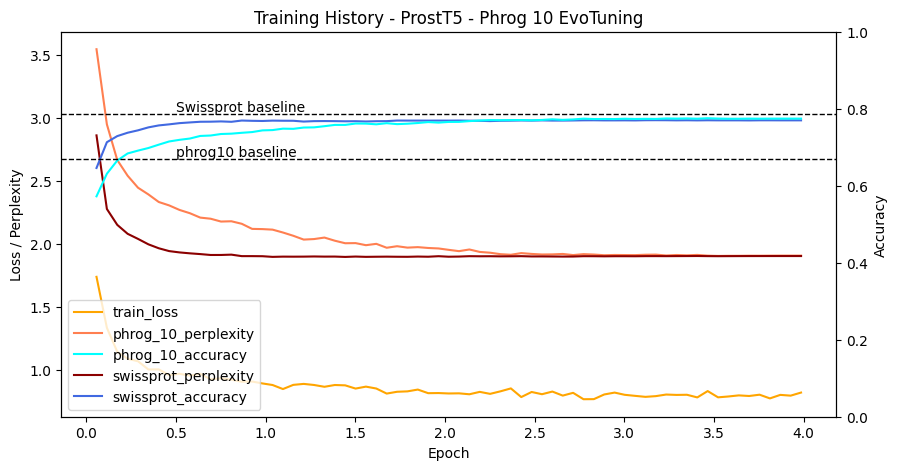

In [12]:
# Load the JSON file
with open("../../log_history.json", "r") as f:
    history = json.load(f)

# Access the log history
print(history)

loss = [x['loss'] for x in history if 'loss' in x]

# Get spearman (for regression) or accuracy value (for classification)

metric = [x['eval_swissprot_perplexity'] for x in history if 'eval_swissprot_perplexity' in x]
metric2 = [x['eval_phrog_10_perplexity'] for x in history if 'eval_phrog_10_perplexity' in x]

acc = [x['eval_swissprot_accuracy'] for x in history if 'eval_swissprot_accuracy' in x]
acc2 = [x['eval_phrog_10_accuracy'] for x in history if 'eval_phrog_10_accuracy' in x]

epochs = [x['epoch'] for x in history if 'loss' in x]
epochsv = [x['epoch'] for x in history if 'eval_swissprot_perplexity' in x]

# Create a figure with two y-axes
fig, ax1 = plt.subplots(figsize=(10, 5))
ax2 = ax1.twinx()

# Plot loss and val_loss on the first y-axis
line1 = ax1.plot(epochs, loss, color="orange", label='train_loss')
line2 = ax1.plot(epochsv, metric2, color='coral', label='phrog_10_perplexity')
line3 = ax1.plot(epochsv, metric, color='darkred', label='swissprot_perplexity')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss / Perplexity')

# Plot the computed metric on the second y-axisload_model
line4 = ax2.plot(epochsv, acc, color='royalblue', label='swissprot_accuracy')
line5 = ax2.plot(epochsv, acc2, color='cyan', label='phrog_10_accuracy')
ax2.set_ylabel('Accuracy')
ax2.set_ylim([0, 1])

# Combine the lines from both y-axes and create a single legend
lines = line1 + line2 + line5 + line3 + line4
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc='lower left')

# Add horizontal lines
# ax2.axhline(y=0.7856, color='black', linestyle='--', linewidth=1)
# ax2.axhline(y=0.6682, color='black', linestyle='--', linewidth=1)

ax2.axhline(y=0.7856, color='black', linestyle='--', linewidth=1)
ax2.text(x=0.5, y=0.7856, s="Swissprot baseline", color='black', ha='left', va='bottom', fontsize=10)

ax2.axhline(y=0.6682, color='black', linestyle='--', linewidth=1)
ax2.text(x=0.5, y=0.6682, s="phrog10 baseline", color='black', ha='left', va='bottom', fontsize=10)


# Show the plot
plt.title("Training History - ProstT5 - Phrog 10 EvoTuning")
plt.show()

# Sanity Check and add baseline ProstT5 Encoder-Decoder Accuracy with Vanilla ProstT5 prior to Finetuning

* generated with the `translate.py` script from the ProstT5 repo e.g.

```
python ProstT5/scripts/translate.py -i phrog_10_db_subset_aa.fasta -o phrog_10_subset_prostt5_vanilla_env_dec
python ProstT5/scripts/translate.py -i swissprot_subset_aa.fasta -o swissprot_subset_prostt5_vanilla_env_dec
```

* The results made it into the above plot

In [23]:
phrog_10_enc_dec_subset = "phrog_10_subset_prostt5_vanilla_env_dec/generated_sequences.fasta"
swissprot_subset_enc_dec_subset = "swissprot_subset_prostt5_vanilla_env_dec/generated_sequences.fasta"

# need to strip off the 0_ prepended by translate.py
phrog_10_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(phrog_10_enc_dec_subset, "fasta")}
swissprot_subset_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(swissprot_subset_enc_dec_subset, "fasta")}

#print(swissprot_subset_enc_dec_records)

phrog_10_colabfold_ground_truth = "phrog_10_db_subset_ss.fasta"
swissprot_colabfold_ground_truth = "swissprot_subset_ss.fasta"

phrog_10_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(phrog_10_colabfold_ground_truth, "fasta")}
swissprot_subset_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(swissprot_colabfold_ground_truth, "fasta")}


#print(swissprot_subset_colabfold_records)

def calculate_accuracy(colabfold_records, enc_dec_records):
    matching_bases = 0
    total_bases = 0

    # Compare the sequences for IDs present in both datasets
    common_ids = set(colabfold_records.keys()) & set(enc_dec_records.keys())
    #print(len(common_ids))
    for record_id in common_ids:

        seq1 = colabfold_records[record_id]
        seq2 = enc_dec_records[record_id]
        
        # # Ensure sequences are the same length before comparing
        # min_len = min(len(seq1), len(seq2))
        # seq1 = seq1[:min_len]
        # seq2 = seq2[:min_len]
        
        # Update counters
        matching_bases += sum(1 for a, b in zip(seq1, seq2) if a == b)
        total_bases += len(seq1)

    # Calculate the percentage of matching bases
    percentage_matching = (matching_bases / total_bases) * 100 if total_bases > 0 else 0

    
    print(percentage_matching)
    return  percentage_matching

print("Swissprot")
calculate_accuracy(swissprot_subset_colabfold_records, swissprot_subset_enc_dec_records)
print("Phrog 10")
calculate_accuracy(phrog_10_colabfold_records, phrog_10_enc_dec_records)



Swissprot
78.56267864434463
Phrog 10
66.82347670250897


66.82347670250897

# Load the EvoTuned model and merge adapter

* Lets us run the LoRA finetuned model on inference later

In [13]:
# load one of the saved model checkpoints
tokenizer, model = load_lora_model(checkpoint, "checkpoints/Phrog_10_tuning_step_1728.pth", cache_dir="model_cache")

T5_EncDec
Trainable Parameter: 2818852864
T5_LoRA_EncDec
Trainable Parameter: 5900288



/tmp/ipykernel_17439/543021595.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  non_frozen_params = torch.load(filepath)


In [14]:
# merge the trained LoRA adapter into the original model for generation
# this can be useful to continue working with the Evo-Tuned model (e.g. for fine-tuning it on some downstream task)
merged_model = model.cpu().merge_and_unload('default')

print(merged_model)



Unloading and merging model: 100%|██████████| 1357/1357 [00:00<00:00, 1465.98it/s]

T5ForConditionalGeneration(
  (shared): Embedding(150, 1024)
  (encoder): T5Stack(
    (embed_tokens): Embedding(150, 1024)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=1024, out_features=4096, bias=False)
              (k): Linear(in_features=1024, out_features=4096, bias=False)
              (v): Linear(in_features=1024, out_features=4096, bias=False)
              (o): Linear(in_features=4096, out_features=1024, bias=False)
              (relative_attention_bias): Embedding(32, 32)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseActDense(
              (wi): Linear(in_features=1024, out_features=16384, bias=False)
              (wo): Linear(in_features=16384, out_features=1024, bias=False)
              (dro

# Check that it works on inference

* Taken from the encoder-decoder `translate.py` [script in the ProstT5 repo](https://github.com/mheinzinger/ProstT5/blob/main/scripts/translate.py), without the argparse stuff

In [15]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Mon Jun 12 21:59:01 2023

@author: mheinzinger
"""


import argparse
import time
from pathlib import Path

from transformers import T5Tokenizer, AutoModelForSeq2SeqLM, set_seed
set_seed(42) # ensure reproducability
import torch
if torch.cuda.is_available():
    device = torch.device('cuda:0')
elif torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print("Using device: {}".format(device))

import json

# If you want to experiment with your own generation config, add it here
class GenConfigs():
    def __init__(self):
        self.configs = self.get_configs()
    
    def get_configs(self):
        configs={}
        configs["aa2ss"] = self.aa2ss()
        configs["ss2aa"] = self.ss2aa()
        return configs
    
    def aa2ss(self):
        return { 
                  "do_sample": True,
                  "num_beams": 3, 
                  "top_p" : 0.95, 
                  "temperature" : 1.2, 
                  "top_k" : 6,
                  "repetition_penalty" : 1.2,
                }
    
    def ss2aa(self):
        return {
            "do_sample": True,
            "top_p" : 0.85,
            "temperature" : 1.0,
            "top_k" : 3,
            "repetition_penalty" : 1.2,
            }



def read_fasta( fasta_path, split_char, id_field, is_3Di ):
    '''
        Reads in fasta file containing multiple sequences.
        Returns dictionary of holding multiple sequences or only single 
        sequence, depending on input file.
    '''
    
    sequences = dict()
    with open( fasta_path, 'r' ) as fasta_f:
        for line in fasta_f:
            # get uniprot ID from header and create new entry
            if line.startswith('>'):
                uniprot_id = line.replace('>', '').strip().split(split_char)[id_field]
                sequences[ uniprot_id ] = ''
            else:
                # repl. all white-space chars and join seqs spanning multiple lines
                if is_3Di:
                    sequences[ uniprot_id ] += ''.join( line.split() ).replace("-","").lower()
                else:
                    sequences[ uniprot_id ] += ''.join( line.split() ).replace("-","")
    
    example = sequences[uniprot_id]
        
    print("##########################")
    print(f"Input is 3Di: {is_3Di} . Sequence below should be lower-case if input is 3Di.")
    print(f"Example sequence: >{uniprot_id}\n{example}")
    print("##########################")
    
    return sequences


def write_fasta(out_path,results,prefix):
    seq_out_p = out_path / f"{prefix}_sequences.fasta"
    with open(seq_out_p,"w") as out_f: # write sequences
        out_f.write( "\n".join( [ f">{seq_id}\n{seq}" 
                                 for seq_id, seq in results.items() 
                                 ] ) )
    return None

def write_config(out_path,gen_kwargs):
    with open(out_path/"gen_config.json","w") as out_f:
        json.dump(gen_kwargs, out_f, ensure_ascii=False)
    return None

def translate(in_path, 
              out_path, 
              split_char, 
              id_field, 
              half_precision, 
              is_3Di, 
              gen_kwargs,
              # the number of sequences you want to generate per input sequence
              # Similar to batching (below) but for each input sequence individually
              # this can lead to RunTimeError/OOM if set too high
              num_return_sequences=1, 
              # Batch parameters. This increases number of input sequences processed in parallel.
              # set max_batch=1 if you need to ensure that sequences are of identical length
              # otherwise, there can be minimal length mismatch for border-line cases
              max_residues=4000, max_seq_len=1000, max_batch=1,
              ):
    
    if out_path.is_dir():
        print("Result directory already exists! - Watch out to not overwriting existing results!")
    else:
        out_path.mkdir()
    
    # already have this
    # model, tokenizer = get_T5_model(model_dir, half_precision)
    model = merged_model.to(device)

    custom_tokens = ["<AA2fold>", "<fold2AA>"]
    tokenizer.add_special_tokens({"additional_special_tokens": custom_tokens})

    

    seq_dict = read_fasta( in_path, split_char, id_field, is_3Di )
    seq_dict = { s_id : s for s_id, s in seq_dict.items() }
            
    if is_3Di: # if we go from 3Di (start/s) to AA (target/t) 
        prefix_s2t = "<fold2AA>"
        # don't generate 3Di or rare/ambig. AAs when outputting AA
        noGood = "acdefghiklmnpqrstvwyXBZ"

    else: # if we go from AA (start) to 3Di (target)
        prefix_s2t = "<AA2fold>"
        # don't generate AAs when outputting 3Di
        noGood = "ARNDBCEQZGHILKMFPSTWYVXOU"
        
    bad_words = tokenizer( [" ".join(list(noGood))], 
                          add_special_tokens=False
                          ).input_ids


    avg_length = int(sum([ len(seq) for _, seq in seq_dict.items()]) / len(seq_dict))
    # start with longest sequences to quickly debug OOM
    seq_dict   = sorted( seq_dict.items(), key=lambda kv: len( seq_dict[kv[0]] ), reverse=True )
    
    print("Average sequence length: {} measured over {} sequences".format(avg_length, len(seq_dict)))
    print("Parameters used for generation: {}".format(gen_kwargs))
    
    batch = list()
    generation_results = {}
    
    start = time.time()
    for seq_idx, (fasta_id, seq) in enumerate(seq_dict,1): # for each sequence in the FASTA file
        seq_len = len(seq)
        seq = seq.replace('U','X').replace('Z','X').replace('O','X').replace("B","X")
        seq = " ".join(list(seq))
        batch.append((fasta_id,seq,seq_len))
        
        # count residues in current batch and add the last sequence length to
        # avoid that batches with (n_res_batch > max_residues) get processed 
        n_res_batch = sum([ s_len for  _, _, s_len in batch ]) + seq_len 
        if len(batch) >= max_batch or n_res_batch>=max_residues or seq_idx==len(seq_dict) or seq_len>max_seq_len:
            ids, seqs, seq_lens = zip(*batch)
            batch = list()
            max_len=int( max(seq_lens) + 1) 
            min_len=int( min(seq_lens) + 1)

            # starting point tokens
            start_encoding = tokenizer.batch_encode_plus( [prefix_s2t + " " + s for s in seqs], 
                                       add_special_tokens=True,
                                       padding="longest",
                                       return_tensors='pt' 
                                       ).to(device)
            
            try:
                with torch.no_grad():
                    # forward translation tokens
                    target = model.generate( 
                        start_encoding.input_ids, 
                        attention_mask=start_encoding.attention_mask, 
                        max_length=max_len, # max length of generated text
                        min_length=min_len, # minimum length of the generated text
                        early_stopping=True, # stop early if end-of-text token is generated
                        length_penalty=1.0, # import for correct normalization of scores
                        bad_words_ids=bad_words, # avoid generation of tokens from other vocabulary
                        num_return_sequences=num_return_sequences, # return only a single sequence
                        **gen_kwargs
                        )
            except RuntimeError as e:
                # rare cases trigger the following error (seemed to depend on generation config):
                # RuntimeError: probability tensor contains either `inf`, `nan` or element < 0
                print(f"RuntimeError during target generation for {fasta_id}")
                print("If this is triggered by OOM, try lowering num_return_sequences and/or max_batch")
                print(e)
                continue
            
            t_strings = tokenizer.batch_decode( target, skip_special_tokens=True )

            for batch_idx, identifier in enumerate(ids): # all individual input sequences in a batch
                for seq_idx in range(num_return_sequences): # all sequences generated per individual input sequence
                    out_id = f"{seq_idx}_" + identifier
                    s_len = seq_lens[batch_idx]
                    # offset accounts for multiple sequences generated per input sequence 
                    batch_seq_idx = (batch_idx*num_return_sequences) + seq_idx
                    t_seq = "".join( t_strings[batch_seq_idx].split(" ")) # target sequence (prediction)
                    t_len = len(t_seq)
                    
                    # this is only triggered rarely and only if processing in batched mode, 
                    # happens esp. for proteins with L>512 (beyond training length)

                    if t_len!=s_len:
                        print(f"source length={s_len} vs target length={t_len}")
                        if t_len>s_len: # truncate if target longer than groundtruth
                            t_seq = t_seq[:s_len] 
                        elif s_len<t_len:
                            while t_len<s_len:
                                t_seq+="d" # append d's in case of too short
                                t_len=len(t_seq)
                    
                    generation_results[out_id] = t_seq
                    if len(generation_results) == 1:
                        print(f"Example generation for {out_id}:\nseqs[batch_idx]\n{generation_results[out_id]}")

        
    compute_time = (time.time() - start)
    print(f"Translating {len(generation_results)} proteins with an avg. length of {avg_length} "+
          f" took {compute_time/60:.1f}[m] ({compute_time/len(generation_results):.1f}[s/protein])\n"+
          "Writing results ..."
          )
    write_fasta(Path(out_path),generation_results,"generated")
    if len(gen_kwargs)>0:
        write_config(out_path,gen_kwargs)
    return None


gen_configs = GenConfigs()
# AA to 3Di
gen_config = gen_configs.configs["aa2ss"]




Using device: cuda:0


# Generate LoRA Enc-Dec 3Di predictions of the validation datasets on inference

In [20]:


translate( in_path=Path("data/phrog_10_db_subset_aa.fasta"), 
            out_path=Path("data/phrog_10_subset_aa_lora_enc_dec"), 
            split_char='!',
            id_field=0,
            half_precision=False,
            is_3Di=False,
            gen_kwargs=gen_config
            )

translate( in_path=Path("data/swissprot_subset_aa.fasta"), 
            out_path=Path("data/swissprot_subset_aa_lora_enc_dec"), 
            split_char='!',
            id_field=0,
            half_precision=False,
            is_3Di=False,
            gen_kwargs=gen_config
            )


Result directory already exists! - Watch out to not overwriting existing results!
{'eos_token': '</s>', 'unk_token': '<unk>', 'pad_token': '<pad>', 'additional_special_tokens': ['<AA2fold>', '<fold2AA>']}
##########################
Input is 3Di: False . Sequence below should be lower-case if input is 3Di.
Example sequence: >AF-B1ZWF5-F1-model_v4 50S ribosomal protein L36
MKVVSSIKSAKKRHPACQVVRRRGKIYVINKVEPRYKARQG
##########################
Average sequence length: 326 measured over 30 sequences
Parameters used for generation: {'do_sample': True, 'num_beams': 3, 'top_p': 0.95, 'temperature': 1.2, 'top_k': 6, 'repetition_penalty': 1.2}
['d e e e e e d q a a p p q a d d d c l n v q v p q l q v l l v v v v y q y e y e y a p a p s n c v d p q n v v w d f d d w d w f d f q p d i d i w t w t w g d p d p r y i y i y t d d c v q h h d p d s q d d v p d g d p c l l v s l l s s l r s v v v v c v v v v h d g q e y e y e a l s n l c n l v v q v v c c v v p n d d r n h a y e y e y a a l v d f p w a a

# Calculate accuracy of LoRA finetuned model on Swissprot and PHROG 10 subset

* Baselines before LoRA finetuning were 78.56% (Swissprot) and 66.82% (Phrog 10) accuracy
* Now we are 78.22% for Swissprot and 76.7%! for Phrog 10, approx a 10% increase

In [22]:
phrog_10_enc_dec_subset = "phrog_10_subset_aa_lora_enc_dec/generated_sequences.fasta"
swissprot_subset_enc_dec_subset = "swissprot_subset_aa_lora_enc_dec/generated_sequences.fasta"

# need to strip off the 0_ prepended by translate.py
phrog_10_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(phrog_10_enc_dec_subset, "fasta")}
swissprot_subset_enc_dec_records = {record.id.lstrip("0_"): str(record.seq).upper() for record in SeqIO.parse(swissprot_subset_enc_dec_subset, "fasta")}

#print(swissprot_subset_enc_dec_records)

phrog_10_colabfold_ground_truth = "data/phrog_10_db_subset_ss.fasta"
swissprot_colabfold_ground_truth = "data/swissprot_subset_ss.fasta"

phrog_10_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(phrog_10_colabfold_ground_truth, "fasta")}
swissprot_subset_colabfold_records = {record.id: str(record.seq).upper() for record in SeqIO.parse(swissprot_colabfold_ground_truth, "fasta")}


#print(swissprot_subset_colabfold_records)

def calculate_accuracy(colabfold_records, enc_dec_records):
    matching_bases = 0
    total_bases = 0

    # Compare the sequences for IDs present in both datasets
    common_ids = set(colabfold_records.keys()) & set(enc_dec_records.keys())
    #print(len(common_ids))
    for record_id in common_ids:

        seq1 = colabfold_records[record_id]
        seq2 = enc_dec_records[record_id]
        
        # # Ensure sequences are the same length before comparing
        # min_len = min(len(seq1), len(seq2))
        # seq1 = seq1[:min_len]
        # seq2 = seq2[:min_len]
        
        # Update counters
        matching_bases += sum(1 for a, b in zip(seq1, seq2) if a == b)
        total_bases += len(seq1)

    # Calculate the percentage of matching bases
    percentage_matching = (matching_bases / total_bases) * 100 if total_bases > 0 else 0

    
    print(percentage_matching)
    return  percentage_matching

print("Swissprot")
calculate_accuracy(swissprot_subset_colabfold_records, swissprot_subset_enc_dec_records)
print("Phrog 10")
calculate_accuracy(phrog_10_colabfold_records, phrog_10_enc_dec_records)




Swissprot
78.2155982033483
Phrog 10
76.69130824372759


76.69130824372759